# Pump it Up Data Science Competition

This notebook explores data associated with the Pump It Up data science competition. The overall aim of the project is to use ML to predict the operational status of wells in Tanzania. These wells fell into three categories: functional, functional but in need of repair, and non-functional. 

A lot of EDA was done to determine which features would be used in the final model. Here, however, we present 4 primary questions in detail:
- 1. Is there any geographic pattern to the distribution of non-functional wells?
- 2. Does the kind of waterpoint or extraction method effect the functionality of the well?
- 3. Does asking for money help keep a well functional?
- 4. Does a well's age influence its functionality?

First, import the data and do some very preliminary cleaning.

In [1]:
from functions import *

train_ft = pd.read_csv('pump_data/training_set_features.csv')
train_labels = pd.read_csv('pump_data/training_set_labels.csv')
xtrain, xtest, ytrain, ytest = train_test_split(train_ft, train_labels, random_state=17)
ytest = ytest['status_group']

# merge them for EDA purposes
df = xtrain.merge(ytrain, on='id')

# a numeric version of our target
df['status_group_numeric'] = df['status_group'].map(lambda x: 1 if x == 'functional' else -1 if x == 'non functional' else 0)

# filling in null values
df['funder'] = df['funder'].fillna(value='unknown', axis=0)
df['public_meeting'] = df['public_meeting'].fillna(value='unknown', axis=0)
df['scheme_management'] = df['scheme_management'].fillna(value='unknown', axis=0)

## Question 1 - is there any geographic pattern to the distribution of non-functional wells?

Finding any geographic trends in the data would help us identify which government bodies most urgently need funding for well repairs. It would also help us discern any predictive trends in the data. A map of the country with the wells is provided below.

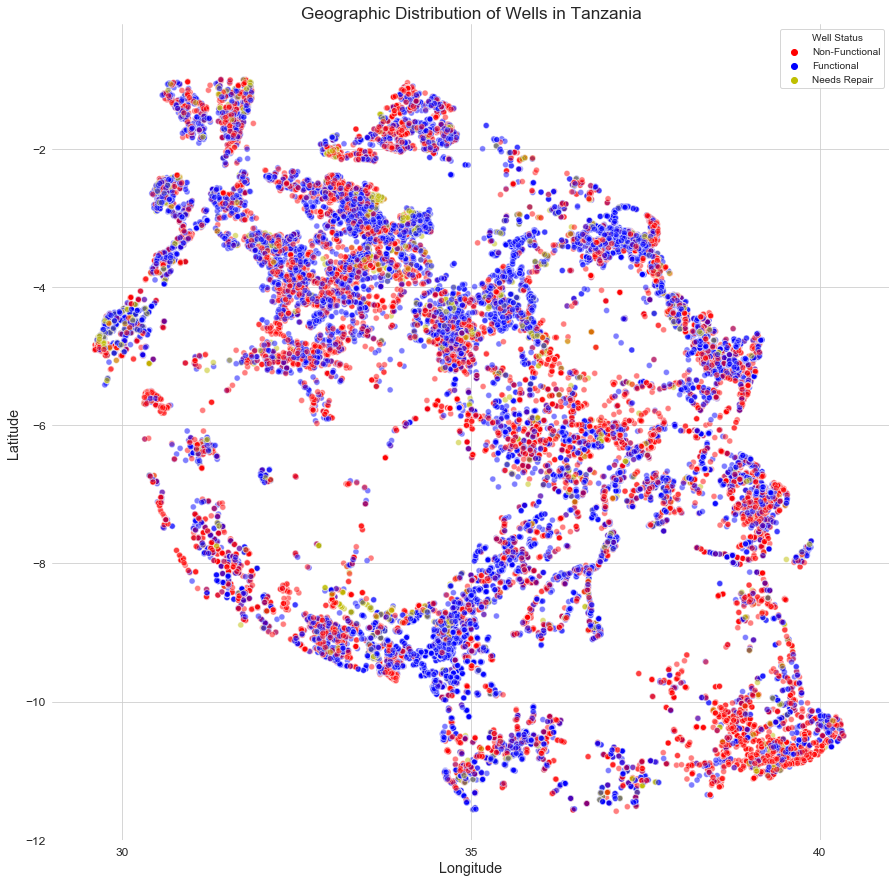

In [6]:
df['Well Status'] = df['status_group'].map(lambda x: 'Functional' if x == 'functional' 
                                                                  else 'Non-Functional' if x == 'non functional' 
                                                                  else 'Needs Repair')
fig = plt.figure(figsize=(15, 15))
sns.set_style('whitegrid')
graph_palette = {'Non-Functional':'r', 'Functional':'b', 'Needs Repair':"y"}
geo_status_chart = sns.scatterplot(data=df, x='longitude', y='latitude', hue='Well Status', alpha=0.5, palette=graph_palette)
sns.despine(left=True, bottom=True)
plt.title('Geographic Distribution of Wells in Tanzania', size='xx-large')
plt.xlabel('Longitude', size='x-large')
plt.ylabel('Latitude', size='x-large')
plt.yticks(ticks=geo_status_chart.get_yticks(), size='large')
plt.xticks(ticks=geo_status_chart.get_xticks(), size='large')
plt.ylim(bottom=-12, top=-0.2)
plt.xlim(left=29, right=41)
plt.show()

From this chart it can be seen that there is no direct geographical line that we could draw to separate functional from non-functional wells. Nonetheless, the wells do seem to form clusters, and there seem to more non-functional wells in the south-eastern section of the country.

Based on this, we recommend prioritizing aid to the regions of Lindi and Mtwara in the South, together with Dodoma, Tabora, and Rukwa in the center of the country and Mwara in the North.

## Question 2 - Does the kind of waterpoint or extraction method effect the functionality of the well?

In Tanzania there are a variety of extraction methods and waterpoints, but these do not all function at the same rates. Below we explore these and see which kinds of extraction or waterpoint are most effective.

Let's look at extraction methods first.

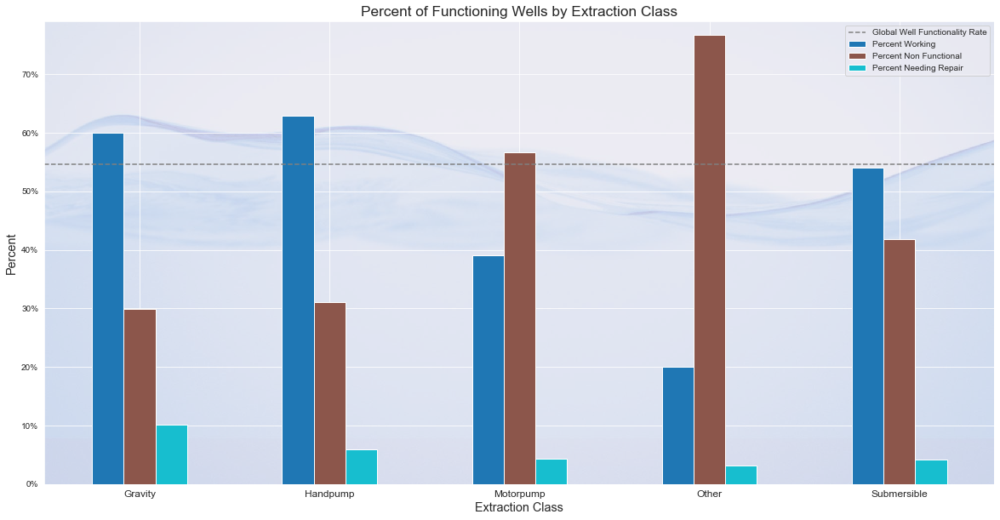

In [67]:
# to begin with, consolidate extraction methods, since some (rope pump and wind-power) are quite rarely used
df['extraction_type_class'] = df['extraction_type_class'].map(lambda x: 'other' if x == 'wind-powered' 
                                                                                else 'other' if x == 'rope pump' 
                                                                                else x)
# call the graphing function
sns.set_style('darkgrid')
extraction_chart = plot_comparison_chart('extraction_type_class', df, overall=False, norm_line=True, cmap='tab10')
extraction_chart.set_title('Percent of Functioning Wells by Extraction Class', size='xx-large')
extraction_chart.set_xlabel('Extraction Class', size='x-large')
extraction_chart.set_ylim(top=0.79)
water = plt.imread('water_backdrop.jpg')
plt.imshow(water, aspect='auto', alpha=0.2, extent=[-0.5, 4.5, 0, 0.8])
plt.show()


From this chart it is evident that most commonly used extraction methods tend to work decently well. Gravity is by far the most popular kind of extraction and it provides a functioning well 60% of the time. Motorpump wells are the only common extraction method that tends to fail often. 

Other miscellenous methods, which account for about 10% of the wells, function at a poor rate. Overall this implies that looking at the extraction method would be a good way to predict whether a well is functional.

Next we look at the waterpoint types to see if there is any similar connection there.

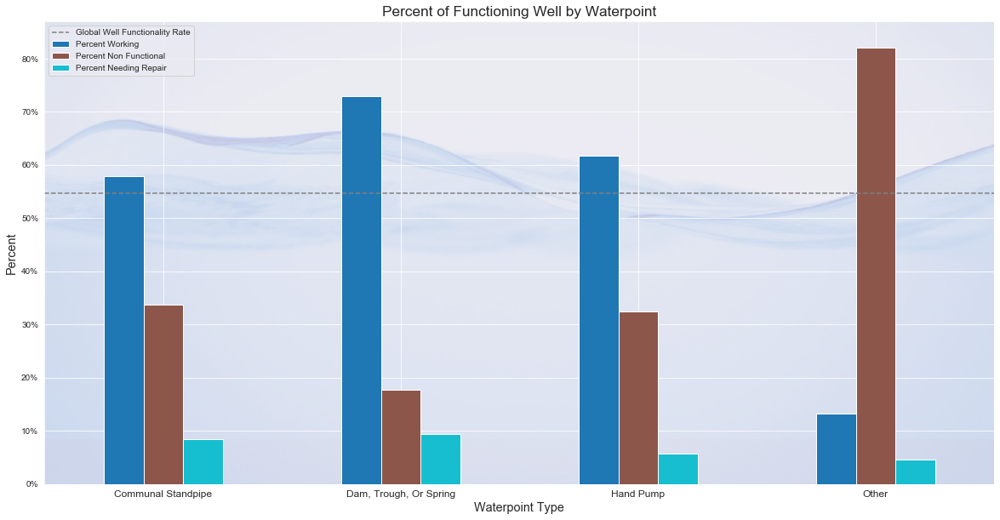

In [69]:
# as before, we consolidate the rare waterpoint types (together they account for only 1.6% of the data). 
# in this case, each of these far outperforms the typical 'other' category, so we made a specific category to consolidate them 
df['waterpoint_type_group'] = df['waterpoint_type_group'].map(lambda x: 'dam, trough, or spring' if x == 'dam' 
                                                                                else 'dam, trough, or spring' if x == 'cattle trough' 
                                                                                else 'dam, trough, or spring' if x == 'improved spring'                                                                                   else x)

waterpoint_chart = plot_comparison_chart('waterpoint_type_group', df, overall=False, norm_line=True, cmap='tab10')
waterpoint_chart.set_title('Percent of Functioning Well by Waterpoint', size='xx-large')
waterpoint_chart.set_xlabel('Waterpoint Type', size='x-large')
plt.imshow(water, aspect='auto', alpha=0.2, extent=[-0.5, 3.5, 0, 0.87])
plt.show()

Here too we find that the two most common waterpoint types (standpipes and hand pums together make up 90% of the waterpoints) have an above-average rate of functionality. There are others, like dams and improved springs, that are quite rare but tend to perform well too. These typically depend on natural features such as springs or existing bodies of water to function, hence their scarcity. 

By contrast, other methods tend to fail at a nearly 80% failure rate. Indeed, though the 'other' category accounts for only 10% of the data, it is solely responsible for dragging down the average functionality rate. All other waterpoint types have above average functionality. 

This has consequences for future wells - we should use these waterpoints more often, and should build on natural water supplies when possible. But this data also provides us with another way to predict whether a well will be functional. 



## Question 3 - Does asking for money help keep a well functional?

About 42% of the wells in our dataset do not require payment from those using them.  

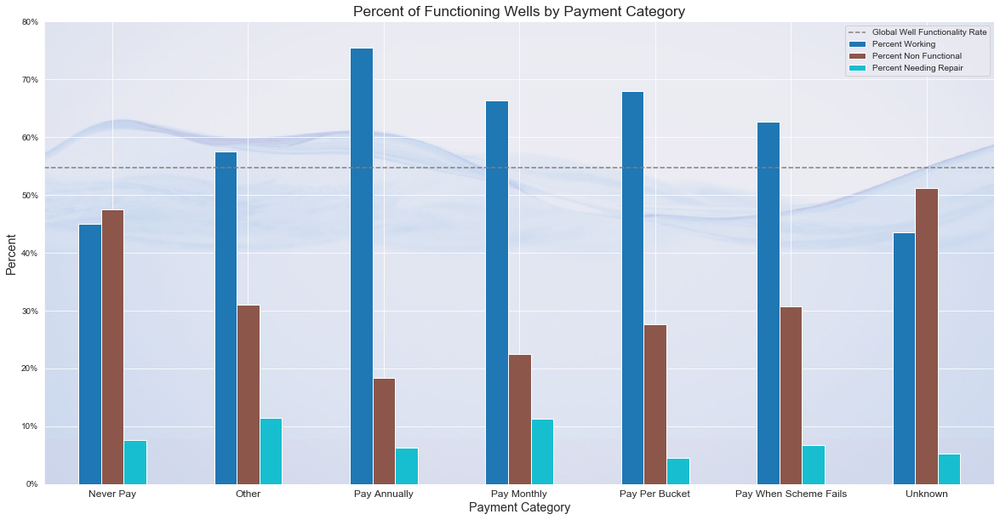

In [65]:
payment_chart = plot_comparison_chart('payment', df, norm_line=True, overall=False, cmap='tab10')
payment_chart.set_title('Percent of Functioning Wells by Payment Category', size='xx-large')
payment_chart.set_xlabel('Payment Category', size='x-large')
plt.imshow(water, aspect='auto', alpha=0.2, extent=[-0.5, 6.5, 0, 0.8])
plt.show()

This chart indicates an above-average functionality rate for all wells that receive payment. Annual payment seems to do exceptionally well. Wells that take in no money do poorly, as do wells whose payment status is unknown. 

Below is a graph that more concisely demonstrates the difference between paying wells and non-paying.

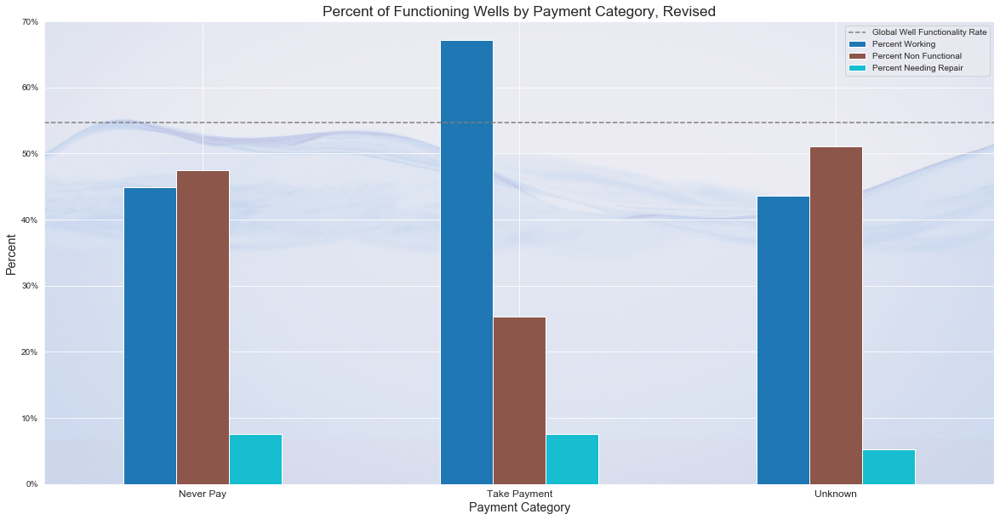

In [63]:
df['pay_vs_no_pay'] = df['payment'].map(lambda x: 'Take Payment' if x == 'pay annually'
                                                                 else 'Take Payment' if x == 'pay monthly'
                                                                 else 'Take Payment' if x == 'pay per bucket'
                                                                 else 'Take Payment' if x == 'pay when scheme fails'
                                                                 else 'Take Payment' if x == 'other'
                                                                 else 'unknown' if x == 'unknown'
                                                                 else x)

ax = plot_comparison_chart('pay_vs_no_pay', df, overall=False, norm_line=True, cmap='tab10') 
ax.set_title('Percent of Functioning Wells by Payment Category, Revised', size='xx-large')
ax.set_xlabel('Payment Category', size='x-large')
plt.imshow(water, aspect='auto', alpha=0.2, extent=[-0.5, 2.5, 0, 0.7])
plt.show()                                                                

As we can see, the take payment category outperforms the dataset mean functionality by over 10%. This means it could be a reasonable predictor. In general, we should consider taking money when we build wells or repair them, since having the money there seems to support well maintenance and functionality.

## Question 4 - Does a well's age influence its functionality?

It seems reasonable that older wells would be more likely to be non functional. Lets put this idea to the test.

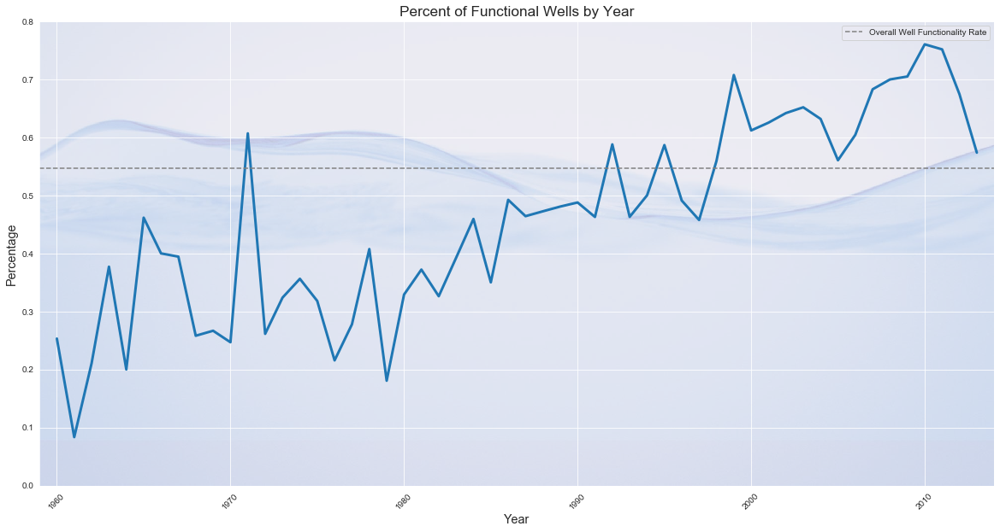

In [74]:
# unfortunately, just over 30% of the wells have a year of 0 listed
# for the purposes of this visualization, we drop those
df_construction_years = df.drop(df.loc[df['construction_year'] == 0].index)

# make a dictionary of years and their percentage of functioning wells
year_dict = {}
for year in df_construction_years['construction_year'].unique():
    year_dict[year] = len(df_construction_years.loc[(df['construction_year'] == year) & (df_construction_years['status_group'] ==      'functional')]) / len(df_construction_years.loc[df['construction_year'] == year])

# plot the results
fig = plt.figure(1, figsize=(20, 10))
sns.lineplot(x=list(year_dict.keys()), y=list(year_dict.values()), linewidth=3)
plt.title('Percent of Functional Wells by Year', size='xx-large')
plt.xlabel('Year', size='x-large')
plt.ylabel('Percentage', size='x-large')
plt.xticks(rotation=45)
plt.axhline(label='Overall Well Functionality Rate', y=.5466, dash_joinstyle='miter', color='gray', ls='--')
plt.legend()
plt.imshow(water, aspect='auto', alpha=0.2, extent=[1959, 2014, 0, 0.8])
plt.show()


From this chart it is evident that newer wells tend to be more functional. Indeed, despite a sad downturn in functionality in the last couple years, the last 15 years or so all produced an above average number of functional wells. And with one exception in 1971, wells constructed before 1990 tend to fail at an above-average rate.

While this doesn't necessary teach us anything surprising, it does confirm that the age of a well should be included in our model. The number of blanks in this section will have to be dealt with smoothly to preserve the usability of the data. So we impute random years, based on the number of wells constructed in each year, to fill it out. This has the overall effect of maintiaining the existing trend as well as slightly balancing out the outlier in 1971. Since more wells were created in recent years, the change from imputing is greater for those. See the graph below.

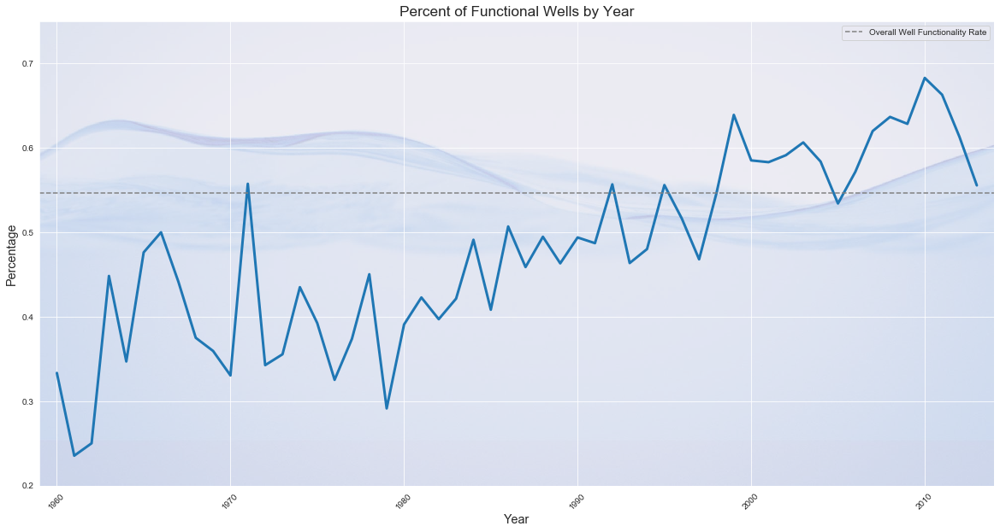

In [76]:
# use a function to impute values. We impute at rates proportional to the number of entries for every year
year_prob_dict = dict(df.drop(df.loc[df['construction_year'] == 0].index)['construction_year'].value_counts(normalize=True))

def turn_0_to_random_year(construction_year):
    if construction_year == 0:
        return np.random.choice(a=list(year_prob_dict.keys()), p=list(year_prob_dict.values()))
    return construction_year

df['construction_year_imputed'] = df['construction_year'].apply(turn_0_to_random_year)

# a dictionary to gather the appropriate percentage for each year
year_dict = {}
for year in df['construction_year_imputed'].unique():
    year_dict[year] = len(df.loc[(df['construction_year_imputed'] == year) & (df['status_group'] == 'functional')]) / len(df.loc[df['construction_year_imputed'] == year])

# plot the results
fig = plt.figure(1, figsize=(20, 10))
sns.lineplot(x=list(year_dict.keys()), y=list(year_dict.values()), linewidth=3)
plt.title('Percent of Functional Wells by Year', size='xx-large')
plt.xlabel('Year', size='x-large')
plt.ylabel('Percentage', size='x-large')
plt.xticks(rotation=45)
plt.axhline(label='Overall Well Functionality Rate', y=.5466, dash_joinstyle='miter', color='gray', ls='--')
plt.legend()
plt.imshow(water, aspect='auto', alpha=0.2, extent=[1959, 2014, 0.2, 0.75])
plt.show()

## Other Observations about the data

- We have identified about about 2000 wells that can provide enough high-quality water, but are listed as 'functional in need of repair.' These should be our top priorities, especially those located in otherwise water-starved regions.

- In addition to these, there are a number of wells which have enough water, but are not functioning at this time. These would be ideal wells to try and repair so that they could become functional. Failing that, we should dig wells near those sites since the water is available there.

With this EDA done, we turn to building our model. Additional cleaning is also performed; that can be observed in the functions.py file, where it is incorporated into the cleaning class that we use in our pipeline.